# POSE pipeline

(Single-modal) In this tutorial, we demonstrate how to perform the POSE pipeline on Breast Cancer (BC) RNA data from TCGA. This analysis entails the following:

1. Upload data
2. Compute pairwise sample (WE) distances with respect to gene neigborhoods 
3. Compute global pairwise sample (WE) distance matrices
4. Convert global distances to a single sample pairwise similarity matrix
5. (Future work - dpt distance and/or multi-scale diffusion based distances)
6. Extract pseudo-organization (i.e., ordering) of samples.
7. Determine schema (i.e., branching).
8. Visualize schema
9. (Future work - further investigation into samples within different branches and differential analysis between branches)

- $d_W(i,j,v)$ - The Wasserstein distance of the 1-hop neighborhood around gene $v$ between sample $i$ and sample $j$
- $d_E(i,j,v)$ - The Euclidean distance of the 1-hop neighborhood around gene $v$ between sample $i$ and sample $j$
- $D_W(i,j) = |d_W(i,j,v)|$ - Net Wasserstein distance between sample $i$ and sample $j$ wrt all genes $v$
- $D_E(i,j) = |d_E(i,j,v)|$ - Net Euclidean distance between sample $i$ and sample $j$ wrt all genes $v$
- $K_W = e^{-\frac{\|D_W\|^2}{\sigma^2}}$ - Pairwise sample Wasserstein similarity matrix 
- $K_E = e^{-\frac{\|D_E\|^2}{\sigma^2}}$ - Pairwise sample Euclidean similarity matrix 
- (Multi-feature, multi-modal) $K = \frac{K_W + K_E}{2}$ - Fused pairwise sample similarity matrix
- $D = 1 - K$ - Fused pairwise sample distance matrix
- (Clustering) Determine branching according to lineage tracing algorithm using $D$ 
- (Visualizing) Pseudo-ordering of samples in branches according to distance from root node $r$, i.e., $D(r,:)$

First, import the necessary packages:

# Load libraries

In [1]:
import pathlib
import sys

import itertools
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import scipy.sparse as sc_sparse

If ``netflow`` has not been installed, add the path to the library:

In [2]:
sys.path.insert(0, pathlib.Path(pathlib.Path('.').absolute()).parents[3].resolve().as_posix())
# sys.path.insert(0, pathlib.Path(pathlib.Path('.').absolute()).parents[0].resolve().as_posix())

From the ``netflow`` package, we load the following modules:
 - The ``InfoNet`` class is used to compute 1-hop neighborhood distances
 - The ``Keeper`` class is used to store and manipulate data/results

In [3]:
import netflow as nf

# from netflow.keepers import keeper 

# Load data

In [4]:
INPUT_DIR = pathlib.Path('/Volumes/DeasyLab3/Rena/KevinM_TCGA_BRCA_immuneTDA/')
RNA_FNAME = INPUT_DIR / 'TCGA_BRCA_TPM.txt'
CIBERSORT_FNAME = INPUT_DIR / 'tcga_cibersort_tda.py'
CLIN_FNAME = INPUT_DIR / 'TCGA_BRCA_clin.csv'
CLIN_SMALL_FNAME = INPUT_DIR / 'TCGA_BRCA_clin_reduced.csv'

RNA_HPRD_FNAME = INPUT_DIR / 'TCGA_BRCA_TPM_HPRD.txt'
E_HPRD_FNAME = INPUT_DIR / 'edgelist_HPRD_TCGA_BRCA_TPM.csv'
# E_FNAME = '/Users/renae12/Library/CloudStorage/OneDrive-MemorialSloanKetteringCancerCenter/!GDriveMigratedData/My Documents/MSKCC/data/multiple_myeloma_apoptosis_ASK/data/E_apop140.csv'

## Restrict to HPRD network (only perform once)

In [5]:
HPRD_FNAME = '/Users/renae12/Documents/MSKCC/dev/GeometricNetworkAnalysis/data/simple_connected_topologies/HPRD_simple_connected.csv'

In [6]:
E = pd.read_csv(HPRD_FNAME, header=0)
G = nx.from_pandas_edgelist(E)
print(G)

Graph with 9188 nodes and 36682 edges


In [7]:
X = pd.read_csv(RNA_FNAME, header=0, index_col=0, sep='\t')

In [8]:
X.shape

(35347, 1111)

Remove genes that have zero expression for all samples:

In [9]:
X = X.loc[X.max(axis=1) > 1e-6]
X.shape

(34251, 1111)

In [12]:
print(f"{len(set(G) & set(X.index))} out of {len(set(X.index))} genes in RNA data")

8544 out of 34168 genes in RNA data


In [13]:
G = G.subgraph(list(set(G) & set(X.index)))
print(G)

Graph with 8544 nodes and 33785 edges


In [14]:
print(f"Largest connected subgraph has {len(max(nx.connected_components(G), key=len))} nodes")

Largest connected subgraph has 8449 nodes


In [15]:
G = G.subgraph(max(nx.connected_components(G), key=len))
print(G)

Graph with 8449 nodes and 33778 edges


In [16]:
X = X.loc[list(G)]
print(X.shape)

(8472, 1111)


Duplicate genes (probably from ensembl id:

Take sum of TPM values -- references: 

- This post says it is ok to add TPM, sort of tersely: https://www.biostars.org/p/9551799/
- This post says the same thing, more descriptive: https://www.biostars.org/p/397198/
- Qiagen says so too: https://qiagen.my.salesforce-sites.com/KnowledgeBase/KnowledgeNavigatorPage?id=kA46N000000k9ifSAA&categoryName=OmicSoft_Suite,OmicSoft_Lands#:~:text=The%20sum%20of%20ALL%20normalized,level%20TPM%20for%20each%20gene

In [17]:
gl = []
for a,b in X.reset_index()[['Gene']].groupby('Gene'):
    if b.shape[0] > 1:
        gl.append(a)
        
print(len(gl))
print(*sorted(gl), sep=', ')

23
BAZ2B, CHN2, CLEC4A, COMMD7, CRHR1, CYB561D2, DET1, FAM50B, GGT1, HLA-DQA1, LGALS7, MATR3, MYO18A, NPAS4, POLA2, PTP4A1, RAET1E, RGS5, SCHIP1, SEC16B, SMN1, ST6GALNAC6, TBCE


In [18]:
X = X.reset_index().groupby('Gene').sum()

In [19]:
X.shape

(8449, 1111)

In [20]:
E = pd.DataFrame(data=list(G.edges()), columns=['source', 'target'])
print(E.shape)

(33778, 2)


In [21]:
X.to_csv(RNA_HPRD_FNAME, header=True, index=True)
E.to_csv(E_HPRD_FNAME, header=True, index=False)

## Load pretty data

First set output directory:

In [5]:
outdir = pathlib.Path('/Users/renae12/OneDrive - Memorial Sloan Kettering Cancer Center/!GDriveMigratedData/My Documents/MSKCC/projects/KevinM_TCGA_BRCA_immuneTDA')
if not outdir.is_dir():
    outdir.mkdir()                      

In [6]:
X = pd.read_csv(RNA_HPRD_FNAME, header=0, index_col=0)
print(X.shape)

(8449, 1111)


In [7]:
E = pd.read_csv(E_HPRD_FNAME, header=0)
G = nx.from_pandas_edgelist(E)
print(G)

Graph with 8449 nodes and 33778 edges


Upload data to the keeper:

In [8]:
# results = keeper.Keeper(data={'rna': X})

data_label = 'rna'
keeper = nf.Keeper(data={data_label: X}, outdir=outdir)
keeper._check_observation_labels()
keeper._check_num_observations()

Add the PPI network to the misc data for storage and later reference.

In [9]:
graph_label = 'PPI'
keeper.add_misc(G, graph_label)

MSG      Added misc input PPI to the keeper.

## Load pathways

In [10]:
PATHWAY_FNAME = pathlib.Path('/Users/renae12/Documents/MSKCC/data/KEGG_pathways_from_OHJ/c2.cp.kegg.v5.2.symbols.xlsx')

In [11]:
pathways = pd.read_excel(PATHWAY_FNAME, header=None, index_col=0)
pathways.head(2)

,1,2,3,4,5,6,7,8,9,10,...,381,382,383,384,385,386,387,388,389,390
0,,,,,,,,,,,,,,,,,,,,,
KEGG_GLYCOLYSIS_GLUCONEOGENESIS,http://www.broadinstitute.org/gsea/msigdb/card...,ACSS2,GCK,PGK2,PGK1,PDHB,PDHA1,PDHA2,PGM2,TPI1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
KEGG_CITRATE_CYCLE_TCA_CYCLE,http://www.broadinstitute.org/gsea/msigdb/card...,IDH3B,DLST,PCK2,CS,PDHB,PCK1,PDHA1,LOC642502,PDHA2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
pathways = pathways.drop(columns=1)
pathways.head(2)

,2,3,4,5,6,7,8,9,10,11,...,381,382,383,384,385,386,387,388,389,390
0,,,,,,,,,,,,,,,,,,,,,
KEGG_GLYCOLYSIS_GLUCONEOGENESIS,ACSS2,GCK,PGK2,PGK1,PDHB,PDHA1,PDHA2,PGM2,TPI1,ACSS1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
KEGG_CITRATE_CYCLE_TCA_CYCLE,IDH3B,DLST,PCK2,CS,PDHB,PCK1,PDHA1,LOC642502,PDHA2,LOC283398,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# print(*sorted(pathways.index), sep='\n')

pws = ['KEGG_B_CELL_RECEPTOR_SIGNALING_PATHWAY',
       'KEGG_NATURAL_KILLER_CELL_MEDIATED_CYTOTOXICITY',
       'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY']

In [14]:
pw_features = set()
for pw in pws:
    pw_features = pw_features | set(pathways.loc[pw].values.tolist()) - set([np.nan])
    print(len(pw_features))

75
171
216


In [15]:
pw_features = list(pw_features & set(G))
print(len(pw_features))

193


# Compute pairwise-sample 1-hop Wasserstein distances

In [16]:
inet = nf.methods.classes.InfoNet(keeper, graph_label, layer=data_label,
                  label='pw_sample_1hop_wass', outdir=None)

MSG      Loaded graph: Graph with 8449 nodes and 33778 edges

MSG      Loaded data: (8449, 1111)

In [17]:
print(inet.G)
for i in range(len(G)):
    if i not in inet.G:
        print(i)
# print('--------')        
# for ix, i in enumerate(sorted(G)):
#     if ix != i:
#         print(ix, i)

Graph with 8449 nodes and 33778 edges


In [18]:
inet.features == list(range(len(G)))

True

In [19]:
dhop = inet.compute_graph_distances(weight=None)

In [20]:
inet.multiple_pairwise_observation_neighborhood_wass_distance(graph_distances=dhop, 
                                                              nodes=pw_features,
                                                              include_self=False,
                                                              label='rna_pw_obs_nbhd_wass_dist',
                                                              desc='Computing pairwise 1-hop distances',
                                                              profiles_desc='t0')

MSG      Loaded saved observation pairwise 1-hop neighborhood Wasserstein distances from t0 profiles of size       
         (616605, 182).

MSG      Added misc input rna_pw_obs_nbhd_wass_dist to the keeper.

__Note:__ Checking for NaN values in distances:

In [21]:
a = keeper.misc['rna_pw_obs_nbhd_wass_dist'] 
print(a.shape)
print(a.isna().sum().sum())
b = a.loc[a.isna().sum(axis=1)>0, a.isna().sum(axis=0)>0]
# genes with NaN distance
b.sum(axis=0)

(616605, 182)
175752


MICA       5636.065586
RAET1G    45669.321846
ULBP1     29755.503031
MICB       5636.065586
FCGR3B       48.757326
dtype: float64

In [22]:
# genes with NaN:
nan_gl = a.columns[a.isna().sum(axis=0)>0]
print(*nan_gl, sep=', ')

MICA, RAET1G, ULBP1, MICB, FCGR3B


In [87]:
# nan_ol = a.index[a.isna().sum(axis=1)>0]
# nan_ol = list(set(itertools.chain(*nan_ol)))
# print(len(nan_ol))

1111


In [23]:
for gn in sorted(nan_gl):
    print(gn, len(list(G.neighbors(gn))), ': ', list(G.neighbors(gn)))

FCGR3B 2 :  ['APCS', 'IGHG1']
MICA 2 :  ['KLRC4', 'KLRK1']
MICB 2 :  ['KLRC4', 'KLRK1']
RAET1G 2 :  ['KLRK1', 'ULBP1']
ULBP1 2 :  ['KLRC4', 'RAET1G']


In [24]:
# remove nan-genes from feature list:

pw_features_nonan = pw_features[:]
for gn in nan_gl:
    if gn in pw_features_nonan:
        pw_features_nonan.remove(gn)
    
print(len(pw_features_nonan))

188


# Compute pairwise-sample 1-hop Euclidean distances

In [25]:
inet.multiple_pairwise_observation_neighborhood_euc_distance(nodes=pw_features,
                                                             include_self=True,
                                                             label='rna_pw_obs_nbhd_euc_dist',
                                                             desc='Computing pairwise 1-hop distances',
                                                             profiles_desc='t0')

MSG      Loaded saved observation pairwise 1-hop neighborhood Euclidean distances from t0 profiles of size (616605,
         182).

MSG      Added misc input rna_pw_obs_nbhd_euc_dist to the keeper.

# Compute pairwise-sample profile Wasserstein distances

# Compute pairwise-sample profile Euclidean distances

# Convert multi-feature distances to single distance (no nan) via norm:

In [32]:
# compute norm of distances as vector:
# nf.methods.metrics.norm_features(keeper, 'rna_pw_obs_nbhd_wass_dist', label='norm_rna_pw_obs_nbhd_wass_dist')
# nf.methods.metrics.norm_features(keeper, 'rna_pw_obs_nbhd_euc_dist', label='norm_rna_pw_obs_nbhd_euc_dist')

# convert norm to distance matrix (used to be po.compute_norm_features()):
nf.methods.metrics.norm_features_as_sym_dist(keeper, 'rna_pw_obs_nbhd_wass_dist', 
                                             label='norm_rna_pw_obs_nbhd_wass_dist',
                                             features=[k for k in pw_features_nonan if G.degree(k)>1], # pw_features_nonan, # None, 
                                             method='L1', is_distance=True)
nf.methods.metrics.norm_features_as_sym_dist(keeper, 'rna_pw_obs_nbhd_euc_dist', 
                                             label='norm_rna_pw_obs_nbhd_euc_dist',
                                             features=[k for k in pw_features_nonan if G.degree(k)>1], # pw_features_nonan, # None, 
                                             method='L1', is_distance=True)

MSG      Added distance input norm_rna_pw_obs_nbhd_wass_dist to the keeper.

MSG      Added distance input norm_rna_pw_obs_nbhd_euc_dist to the keeper.

# Compute similarities from distances
- $\sigma$ : Kernel width representing each data point's accessible neighbors. 
- Set $\sigma$ normalization for each obs as the distance to its k-th neighbor : $$K_{ij} = \sqrt{\frac{2\sigma_i\sigma_j}{\sigma_i^2 + \sigma_j^2}}e^{-\frac{|d_{ij}^2|}{2(\sigma_i^2 + \sigma_j^2)}}$$
where for each observation $i$, $\sigma_i$ is the distance to its $k$-th nearest neighbor.

In [33]:
# compute sigmas:
nf.similarity.sigma_knn(keeper, 'norm_rna_pw_obs_nbhd_wass_dist', 
                             label='max5nn_norm_rna_pw_obs_nbhd_wass_dist', 
                             n_neighbors=5, method='max', return_nn=True)
nf.similarity.sigma_knn(keeper, 'norm_rna_pw_obs_nbhd_euc_dist', 
                             label='max5nn_norm_rna_pw_obs_nbhd_euc_dist', 
                             n_neighbors=5, method='max', return_nn=True)



MSG      Added misc input sigmas_max5nn_norm_rna_pw_obs_nbhd_wass_dist to the keeper.

MSG      Added misc input nn_indices_max5nn_norm_rna_pw_obs_nbhd_wass_dist to the keeper.

MSG      Added misc input nn_distances_max5nn_norm_rna_pw_obs_nbhd_wass_dist to the keeper.

MSG      Added misc input sigmas_max5nn_norm_rna_pw_obs_nbhd_euc_dist to the keeper.

MSG      Added misc input nn_indices_max5nn_norm_rna_pw_obs_nbhd_euc_dist to the keeper.

MSG      Added misc input nn_distances_max5nn_norm_rna_pw_obs_nbhd_euc_dist to the keeper.

In [34]:
# compute similarities:
nf.similarity.distance_to_similarity(keeper, 'norm_rna_pw_obs_nbhd_wass_dist', 
                                     5, 'max',
                                     label='similarity_max5nn_norm_rna_pw_obs_nbhd_wass_dist', 
                                     sigmas='sigmas_max5nn_norm_rna_pw_obs_nbhd_wass_dist', 
                                     knn=False, 
                                     indices='nn_indices_max5nn_norm_rna_pw_obs_nbhd_wass_dist')

nf.similarity.distance_to_similarity(keeper, 'norm_rna_pw_obs_nbhd_euc_dist', 
                                     5, 'max',
                                     label='similarity_max5nn_norm_rna_pw_obs_nbhd_euc_dist', 
                                     sigmas='sigmas_max5nn_norm_rna_pw_obs_nbhd_euc_dist', 
                                     knn=False, 
                                     indices='nn_indices_max5nn_norm_rna_pw_obs_nbhd_euc_dist')

MSG      Added similarity input similarity_max5nn_norm_rna_pw_obs_nbhd_wass_dist to the keeper.

MSG      Added similarity input similarity_max5nn_norm_rna_pw_obs_nbhd_euc_dist to the keeper.

In [35]:
# combine and add similarities:
fused_similarity = 0.5*(keeper.similarities['similarity_max5nn_norm_rna_pw_obs_nbhd_wass_dist'].data + \
                        keeper.similarities['similarity_max5nn_norm_rna_pw_obs_nbhd_euc_dist'].data)

fused_key = 'fused_similarity_max5nn_norm_rna_pw_obs_nbhd_wass_euc_dist'
keeper.add_similarity(fused_similarity, fused_key)

MSG      Added similarity input fused_similarity_max5nn_norm_rna_pw_obs_nbhd_wass_euc_dist to the keeper.

- save 1 - fused_similarity as fused distance:

In [36]:
keeper.add_distance(1.-fused_similarity, fused_key)

MSG      Added distance input fused_similarity_max5nn_norm_rna_pw_obs_nbhd_wass_euc_dist to the keeper.

In [37]:
import seaborn as sns

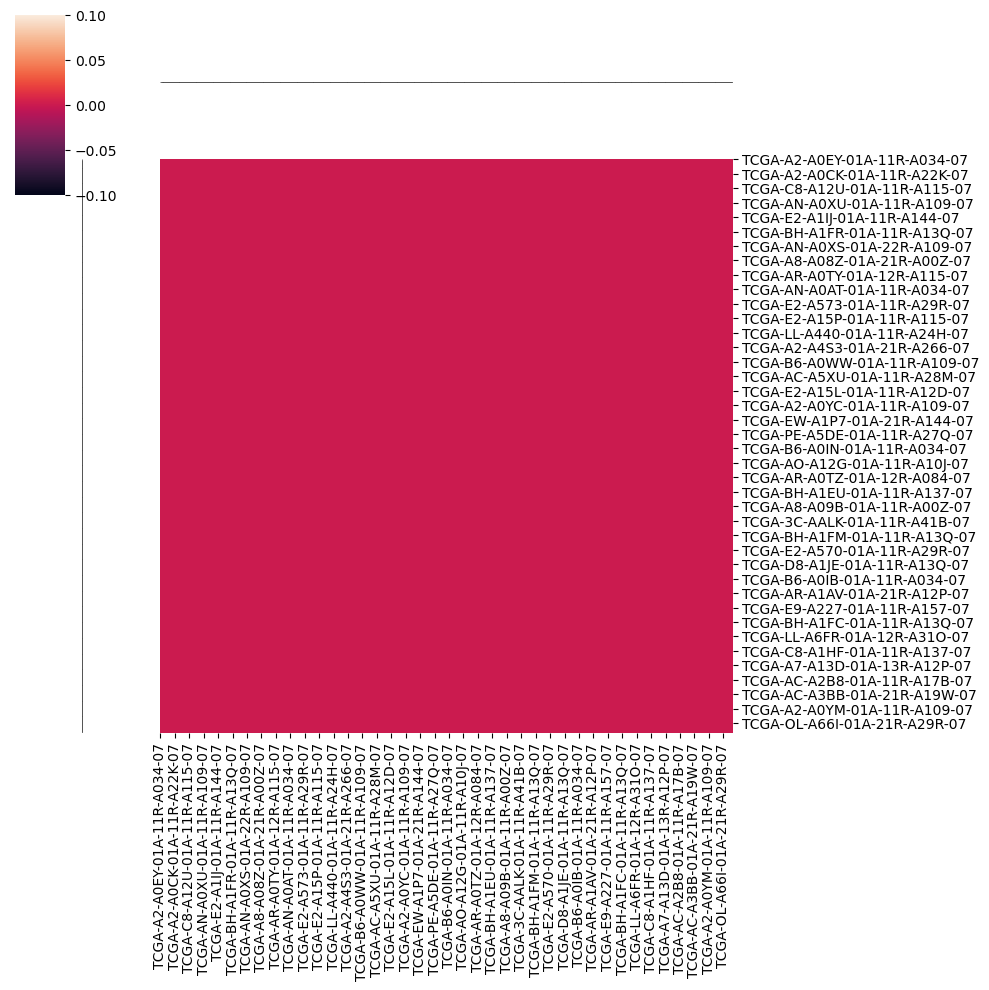

In [38]:
keeper.distances.data.keys()
a = pd.DataFrame(data=keeper.distances['norm_rna_pw_obs_nbhd_wass_dist'].data,
             index=keeper.observation_labels, columns=keeper.observation_labels)

sns.clustermap(a.isna()) # .sum().sum()

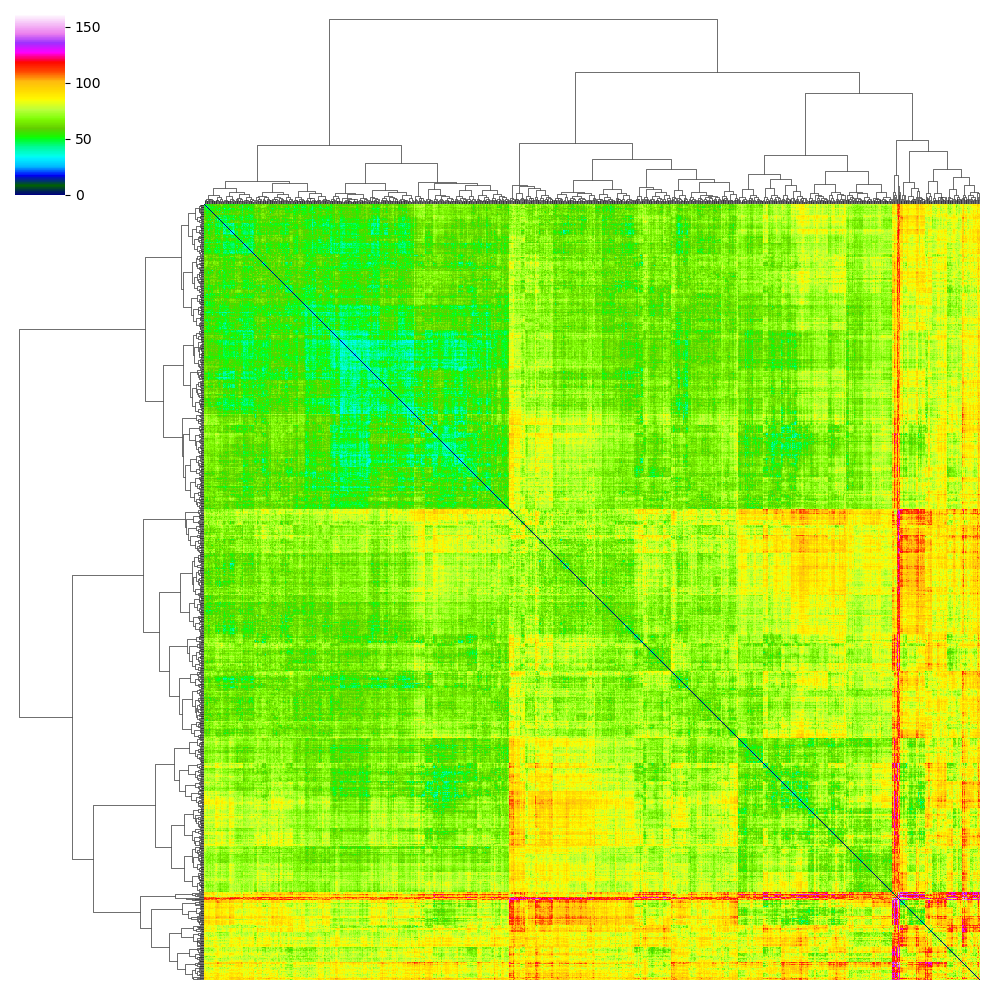

In [39]:
sns.clustermap(pd.DataFrame(data=keeper.distances['norm_rna_pw_obs_nbhd_wass_dist'].data,
             index=keeper.observation_labels, columns=keeper.observation_labels),
              yticklabels=0, xticklabels=0, method='ward', cmap='gist_ncar')

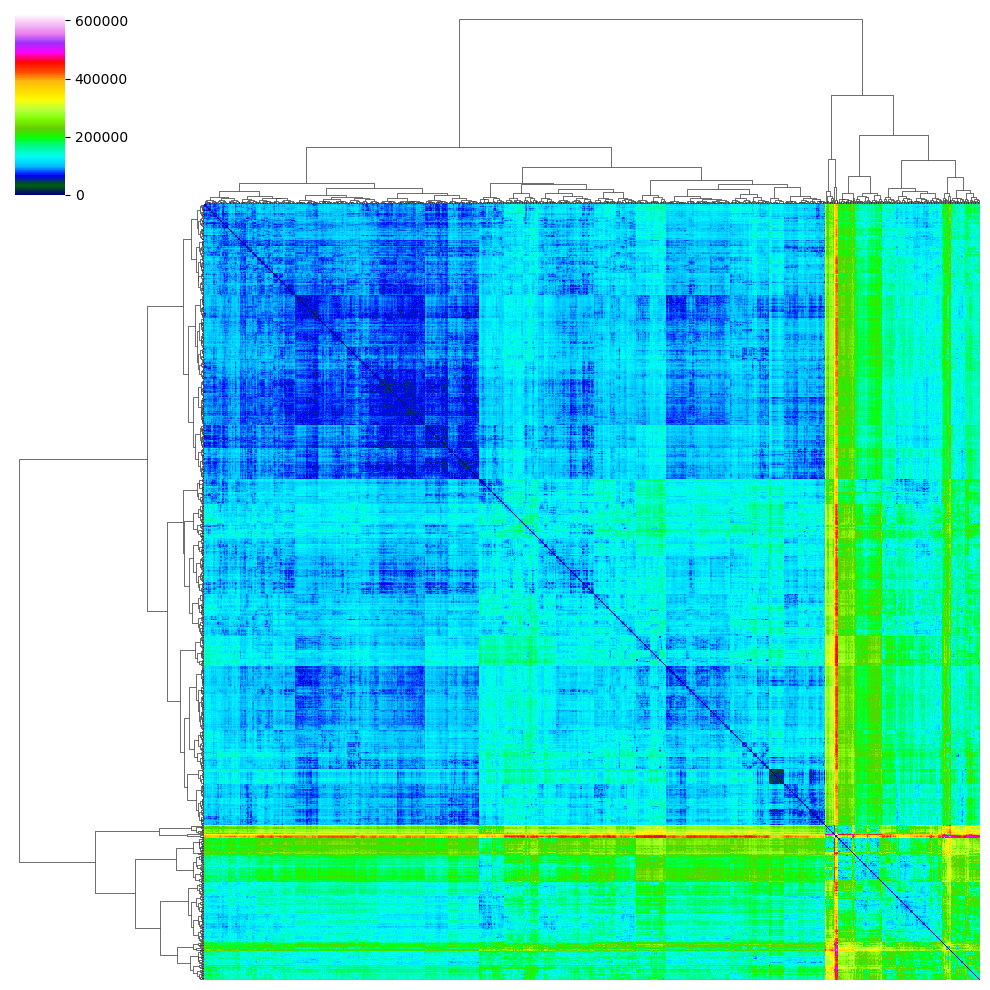

In [40]:
sns.clustermap(pd.DataFrame(data=keeper.distances['norm_rna_pw_obs_nbhd_euc_dist'].data,
             index=keeper.observation_labels, columns=keeper.observation_labels),
              yticklabels=0, xticklabels=0, method='ward', cmap='gist_ncar')

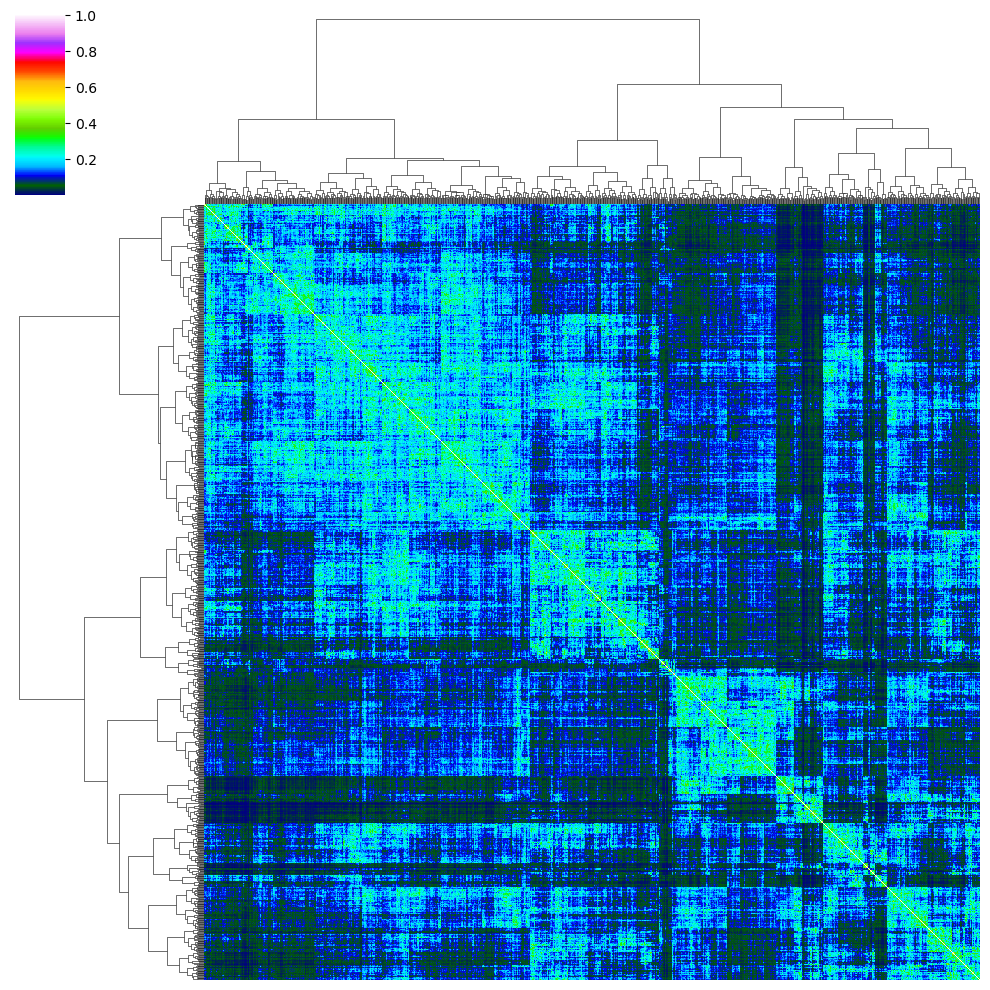

In [48]:
sns.clustermap(pd.DataFrame(data=keeper.similarities['similarity_max5nn_norm_rna_pw_obs_nbhd_wass_dist'].data,
             index=keeper.observation_labels, columns=keeper.observation_labels),
              yticklabels=0, xticklabels=0, method='ward', cmap='gist_ncar')

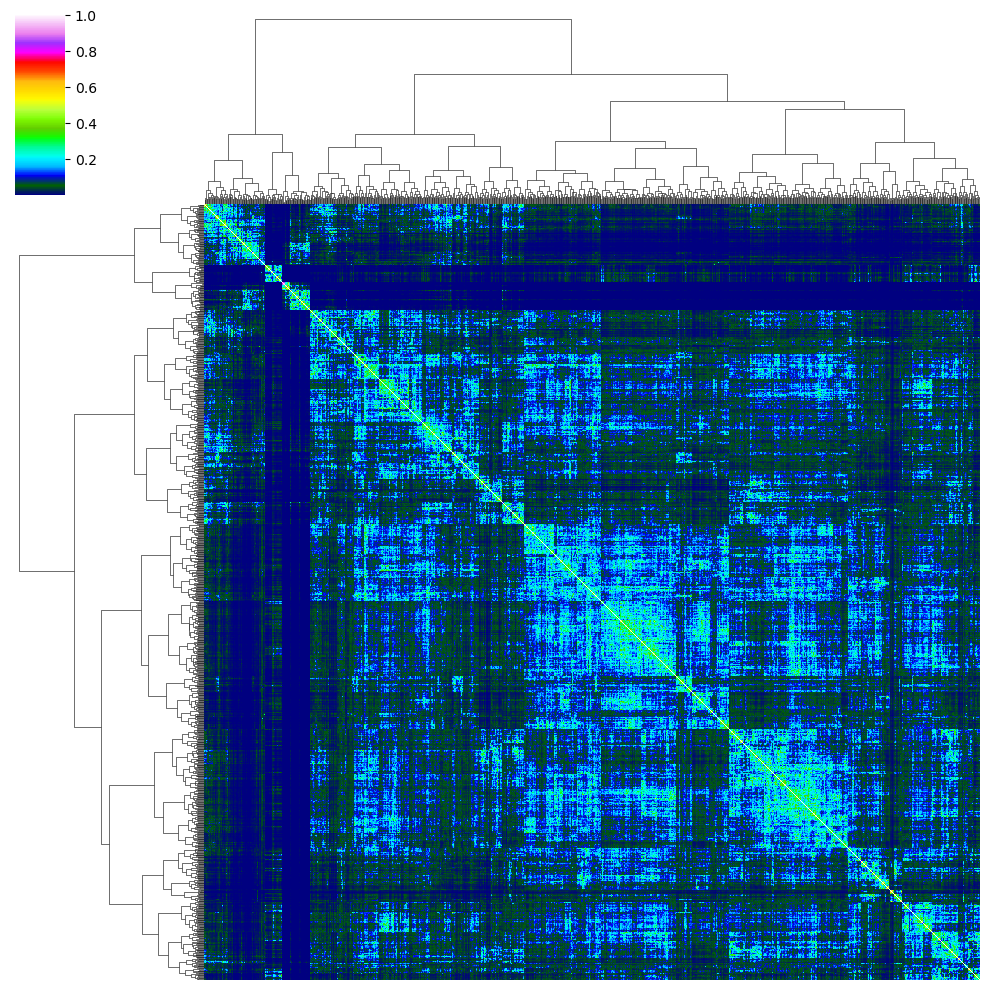

In [49]:
sns.clustermap(pd.DataFrame(data=keeper.similarities['similarity_max5nn_norm_rna_pw_obs_nbhd_euc_dist'].data,
             index=keeper.observation_labels, columns=keeper.observation_labels),
              yticklabels=0, xticklabels=0, method='ward', cmap='gist_ncar')

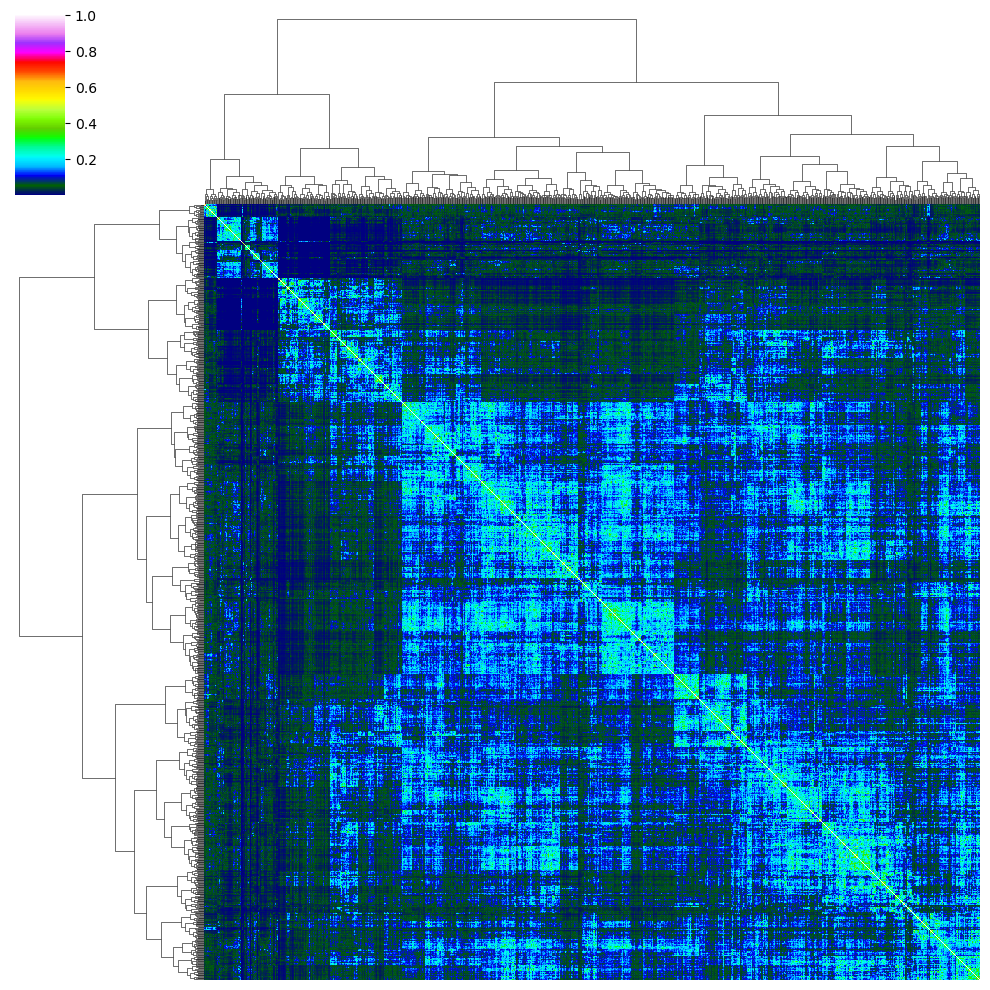

In [55]:
sns.clustermap(pd.DataFrame(data=keeper.similarities[fused_key].data,
             index=keeper.observation_labels, columns=keeper.observation_labels),
              yticklabels=0, xticklabels=0, method='ward', cmap='gist_ncar')

# Compute pseudo-ordering

In [170]:
print(tda_we.distances.shape[0], keeper.num_observations)

1111 1111


- `segs` : `list` list of arrays of length (number of segments). Each entry stores the indices of the members of a segment.
- `segs_tips` : `list` List of arrays of length (number of segments) where Each entry stores the indices of the two tip points of each segment.  
- `segs_undecided` : 
- `segs_adjacency` : 
- `segs_connects` :

`indices_all = np.arange(num_obs)`\
`segs = [indices_all]` \

Algorithm:
- initialize list of segments with single segment, being all points: `segs = [indices_all]`
  (and initialize seg record: `record = {'initialization': np.zeros(n_obs,1)}`)
- for i in `0:n_branches`:
    - select segment: `seg = segs[0]`
    - from `root` of `seg`, find `tip_0 = np.argmax(self.distances[seg-root])`
  

line 1517: def branchings_segments(n_branches):
    line 1538: self.detect_branches(n_branches) -- line 401: def detect_branches(self, n_branches):
        

In [126]:
tda_we = nf.organization.TDA(keeper, fused_key, label='testing',  
                             root=132, # 113, 
                             smooth_corr=True)
n_branches = 5 # 7
tda_we.branchings_segments(n_branches)

WARNING  *ibranch = 0

WARNING  *1 segs = [array([   0,    1,    2, ..., 1108, 1109, 1110])]

WARNING      is root itself, never obtain significant correlation

WARNING  *ibranch = 1

WARNING  *4 segs = [array([  15,   24,   25,   74,   84,   85,  126,  159,  160,  162,  166,                       
                 169,  184,  187,  196,  222,  226,  230,  231,  234,  235,  284,                                  
                 328,  337,  367,  397,  421,  436,  448,  473,  485,  540,  550,                                  
                 568,  580,  617,  628,  629,  644,  663,  675,  713,  715,  731,                                  
                 738,  751,  801,  820,  823,  835,  879,  899,  902,  903,  904,                                  
                 908,  911,  916,  917,  924,  930,  933,  942,  944,  945,  954,                                  
                 961,  976,  981, 1008, 1019, 1029, 1050, 1065, 1081, 1084, 1085]), array([ 443,  480, 1062,       
         1075]), array([  10,   17,   18,   43,   72,   88,  106,  110,  123,  124,  132,                          
                 147,  158,  193,  198,  205,  213,  216,  221,  224,  240,  250,                                  
                 253,  254,  256,  262,  275,  277,  289,  292,  307,  323,  336,                                  
                 339,  346,  349,  359,  368,  377,  388,  400,  406,  413,  426,                                  
                 447,  475,  497,  509,  510,  514,  532,  549,  578,  606,  619,                                  
                 637,  673,  681,  694,  709,  726,  753,  768,  777,  790,  810,                                  
                 811,  830,  836,  844,  861,  900,  918,  926,  939,  940,  943,                                  
                 947,  953,  969,  975, 1003, 1010, 1015, 1036, 1041, 1042, 1043,                                  
                1067, 1068, 1069, 1070, 1073, 1080, 1086, 1097, 1098, 1101]), array([   0,    1,    2,    3,    4, 
         5,    6,    7,    8,    9,   11,                                                                          
                  12,   13,   14,   20,   21,   22,   23,   26,   27,   28,   29,                                  
                  30,   32,   33,   35,   37,   38,   39,   40,   41,   42,   44,                                  
                  45,   46,   47,   48,   49,   50,   52,   53,   54,   55,   58,                                  
                  59,   60,   61,   62,   64,   66,   67,   68,   69,   71,   73,                                  
                  75,   76,   77,   78,   79,   80,   82,   83,   86,   87,   89,                                  
                  90,   91,   93,   94,   95,   96,   98,   99,  100,  101,  102,                                  
                 103,  104,  105,  107,  108,  109,  111,  117,  118,  119,  122,                                  
                 127,  128,  129,  130,  131,  133,  136,  137,  140,  141,  142,                                  
                 143,  144,  145,  146,  148,  149,  150,  152,  153,  161,  163,                                  
                 164,  165,  167,  170,  172,  173,  174,  175,  176,  177,  178,                                  
                 179,  181,  188,  189,  190,  191,  192,  194,  195,  197,  199,                                  
                 200,  204,  206,  207,  209,  210,  212,  215,  217,  218,  219,                                  
                 220,  223,  225,  227,  228,  232,  233,  236,  237,  238,  239,                                  
                 241,  242,  243,  244,  245,  247,  248,  255,  257,  258,  259,                                  
                 260,  261,  264,  266,  267,  269,  270,  271,  274,  276,  278,                                  
                 280,  281,  282,  290,  293,  294,  296,  299,  300,  301,  302,                                  
                 303,  305,  306,  308,  309,  310,  312,  313,  314,  315,  316,                                  
                 317,  319,  320,  321,  324,  326,  327

WARNING      is root itself, never obtain significant correlation

WARNING  tip is no longer in the unique branched sub-segment, update tip to its nearest point in the new segment:  
         71 -> 85

WARNING  detected group with only 1 data points

WARNING  *ibranch = 2

WARNING  *7 segs = [array([  15,   24,   25,   74,   84,   85,  126,  159,  160,  162,  166,                       
                 169,  184,  187,  196,  222,  226,  230,  231,  234,  235,  284,                                  
                 328,  337,  367,  397,  421,  436,  448,  473,  485,  540,  550,                                  
                 568,  580,  617,  628,  629,  644,  663,  675,  713,  715,  731,                                  
                 738,  751,  801,  820,  823,  835,  879,  899,  902,  903,  904,                                  
                 908,  911,  916,  917,  924,  930,  933,  942,  944,  945,  954,                                  
                 961,  976,  981, 1008, 1019, 1029, 1050, 1065, 1081, 1084, 1085]), array([ 443,  480, 1062,       
         1075]), array([  10,   17,   18,   43,   72,  106,  110,  123,  124,  132,  147,                          
                 158,  193,  198,  205,  216,  221,  240,  250,  253,  254,  256,                                  
                 262,  275,  277,  289,  292,  307,  323,  339,  346,  349,  359,                                  
                 368,  377,  388,  400,  406,  413,  447,  475,  497,  510,  532,                                  
                 549,  578,  606,  619,  637,  673,  681,  694,  709,  726,  753,                                  
                 768,  777,  790,  810,  811,  830,  836,  844,  861,  900,  918,                                  
                 926,  939,  940,  943,  947,  953,  969,  975, 1003, 1010, 1015,                                  
                1036, 1042, 1043, 1067, 1068, 1069, 1070, 1073, 1080, 1086, 1097,                                  
                1098, 1101]), array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   11,             
                  12,   13,   14,   20,   21,   22,   23,   26,   27,   28,   29,                                  
                  30,   32,   33,   35,   37,   38,   39,   40,   41,   42,   44,                                  
                  45,   46,   47,   48,   49,   50,   52,   53,   54,   55,   58,                                  
                  59,   60,   61,   62,   64,   66,   67,   68,   69,   71,   73,                                  
                  75,   76,   77,   78,   79,   80,   82,   83,   86,   87,   89,                                  
                  90,   91,   93,   94,   95,   96,   98,   99,  100,  101,  102,                                  
                 103,  104,  105,  107,  108,  109,  111,  117,  118,  119,  122,                                  
                 127,  128,  129,  130,  131,  133,  136,  137,  140,  141,  142,                                  
                 143,  144,  145,  146,  148,  149,  150,  152,  153,  161,  163,                                  
                 164,  165,  167,  170,  172,  173,  174,  175,  176,  177,  178,                                  
                 179,  181,  188,  189,  190,  191,  192,  194,  195,  197,  199,                                  
                 200,  204,  206,  207,  209,  210,  212,  215,  217,  218,  219,                                  
                 220,  223,  225,  227,  228,  232,  233,  236,  237,  238,  239,                                  
                 241,  242,  243,  244,  245,  247,  248,  255,  257,  258,  259,                                  
                 260,  261,  264,  266,  267,  269,  270,  271,  274,  276,  278,                                  
                 280,  281,  282,  290,  293,  294,  296,  299,  300,  301,  302,                                  
                 303,  305,  306,  308,  309,  310,  312,  313,  314,  315,  316,                                  
                 317,  319,  320,  321,  324,  326,  327,  329,  330,  331,  333,                                  
                 334,  335,  340,  341,  342,  343,  344

WARNING      is root itself, never obtain significant correlation

WARNING  segment is more than 95\% correlated.

WARNING  Unique segment is empty, removing from consideration and no branching performed.

WARNING  No unique branch detected - removed from consideration.

WARNING  No further branching occured at this iteration.

WARNING  *ibranch = 3

WARNING  *7 segs = [array([  15,   24,   25,   74,   84,   85,  126,  159,  160,  162,  166,                       
                 169,  184,  187,  196,  222,  226,  230,  231,  234,  235,  284,                                  
                 328,  337,  367,  397,  421,  436,  448,  473,  485,  540,  550,                                  
                 568,  580,  617,  628,  629,  644,  663,  675,  713,  715,  731,                                  
                 738,  751,  801,  820,  823,  835,  879,  899,  902,  903,  904,                                  
                 908,  911,  916,  917,  924,  930,  933,  942,  944,  945,  954,                                  
                 961,  976,  981, 1008, 1019, 1029, 1050, 1065, 1081, 1084, 1085]), array([ 443,  480, 1062,       
         1075]), array([  10,   17,   18,   43,   72,  106,  110,  123,  124,  132,  147,                          
                 158,  193,  198,  205,  216,  221,  240,  250,  253,  254,  256,                                  
                 262,  275,  277,  289,  292,  307,  323,  339,  346,  349,  359,                                  
                 368,  377,  388,  400,  406,  413,  447,  475,  497,  510,  532,                                  
                 549,  578,  606,  619,  637,  673,  681,  694,  709,  726,  753,                                  
                 768,  777,  790,  810,  811,  830,  836,  844,  861,  900,  918,                                  
                 926,  939,  940,  943,  947,  953,  969,  975, 1003, 1010, 1015,                                  
                1036, 1042, 1043, 1067, 1068, 1069, 1070, 1073, 1080, 1086, 1097,                                  
                1098, 1101]), array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   11,             
                  12,   13,   14,   20,   21,   22,   23,   26,   27,   28,   29,                                  
                  30,   32,   33,   35,   37,   38,   39,   40,   41,   42,   44,                                  
                  45,   46,   47,   48,   49,   50,   52,   53,   54,   55,   58,                                  
                  59,   60,   61,   62,   64,   66,   67,   68,   69,   71,   73,                                  
                  75,   76,   77,   78,   79,   80,   82,   83,   86,   87,   89,                                  
                  90,   91,   93,   94,   95,   96,   98,   99,  100,  101,  102,                                  
                 103,  104,  105,  107,  108,  109,  111,  117,  118,  119,  122,                                  
                 127,  128,  129,  130,  131,  133,  136,  137,  140,  141,  142,                                  
                 143,  144,  145,  146,  148,  149,  150,  152,  153,  161,  163,                                  
                 164,  165,  167,  170,  172,  173,  174,  175,  176,  177,  178,                                  
                 179,  181,  188,  189,  190,  191,  192,  194,  195,  197,  199,                                  
                 200,  204,  206,  207,  209,  210,  212,  215,  217,  218,  219,                                  
                 220,  223,  225,  227,  228,  232,  233,  236,  237,  238,  239,                                  
                 241,  242,  243,  244,  245,  247,  248,  255,  257,  258,  259,                                  
                 260,  261,  264,  266,  267,  269,  270,  271,  274,  276,  278,                                  
                 280,  281,  282,  290,  293,  294,  296,  299,  300,  301,  302,                                  
                 303,  305,  306,  308,  309,  310,  312,  313,  314,  315,  316,                                  
                 317,  319,  320,  321,  324,  326,  327,  329,  330,  331,  333,                                  
                 334,  335,  340,  341,  342,  343,  344

WARNING      is root itself, never obtain significant correlation

WARNING  detected group with only 1 data points

WARNING  tip is no longer in the unique branched sub-segment, update tip to its nearest point in the new segment:  
         65 -> 2

WARNING  *ibranch = 4

WARNING  *10 segs = [array([  15,   24,   85,  159,  397,  448,  550,  580,  715,  738,  942,                      
                 954,  976, 1008]), array([ 443,  480, 1062, 1075]), array([  10,   17,   18,   43,   72,  106,    
         110,  123,  124,  132,  147,                                                                              
                 158,  193,  198,  205,  216,  221,  240,  250,  253,  254,  256,                                  
                 262,  275,  277,  289,  292,  307,  323,  339,  346,  349,  359,                                  
                 368,  377,  388,  400,  406,  413,  447,  475,  497,  510,  532,                                  
                 549,  578,  606,  619,  637,  673,  681,  694,  709,  726,  753,                                  
                 768,  777,  790,  810,  811,  830,  836,  844,  861,  900,  918,                                  
                 926,  939,  940,  943,  947,  953,  969,  975, 1003, 1010, 1015,                                  
                1036, 1042, 1043, 1067, 1068, 1069, 1070, 1073, 1080, 1086, 1097,                                  
                1098, 1101]), array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   11,             
                  12,   13,   14,   20,   21,   22,   23,   26,   27,   28,   29,                                  
                  30,   32,   33,   35,   37,   38,   39,   40,   41,   42,   44,                                  
                  45,   46,   47,   48,   49,   50,   52,   53,   54,   55,   58,                                  
                  59,   60,   61,   62,   64,   66,   67,   68,   69,   71,   73,                                  
                  75,   76,   77,   78,   79,   80,   82,   83,   86,   87,   89,                                  
                  90,   91,   93,   94,   95,   96,   98,   99,  100,  101,  102,                                  
                 103,  104,  105,  107,  108,  109,  111,  117,  118,  119,  122,                                  
                 127,  128,  129,  130,  131,  133,  136,  137,  140,  141,  142,                                  
                 143,  144,  145,  146,  148,  149,  150,  152,  153,  161,  163,                                  
                 164,  165,  167,  170,  172,  173,  174,  175,  176,  177,  178,                                  
                 179,  181,  188,  189,  190,  191,  192,  194,  195,  197,  199,                                  
                 200,  204,  206,  207,  209,  210,  212,  215,  217,  218,  219,                                  
                 220,  223,  225,  227,  228,  232,  233,  236,  237,  238,  239,                                  
                 241,  242,  243,  244,  245,  247,  248,  255,  257,  258,  259,                                  
                 260,  261,  264,  266,  267,  269,  270,  271,  274,  276,  278,                                  
                 280,  281,  282,  290,  293,  294,  296,  299,  300,  301,  302,                                  
                 303,  305,  306,  308,  309,  310,  312,  313,  314,  315,  316,                                  
                 317,  319,  320,  321,  324,  326,  327,  329,  330,  331,  333,                                  
                 334,  335,  340,  341,  342,  343,  344,  345,  347,  348,  350,                                  
                 351,  352,  353,  354,  355,  356,  357,  358,  360,  362,  363,                                  
                 364,  365,  366,  369,  370,  371,  372,  373,  374,  375,  376,                                  
                 378,  379,  380,  381,  382,  384,  385,  386,  390,  392,  395,                                  
                 396,  398,  399,  401,  402,  403,  404,  405,  407,  408,  410,                                  
                 411,  412,  415,  416,  417,  418,  419

In [127]:
tda_we.indices

array([862, 298, 297, ..., 726, 221, 240])

In [128]:
tda_we.ordering

array([701, 884, 569, ..., 557, 108, 367])

In [129]:
tda_we.segs

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [130]:
tda_we.segs_adjacency.todense()

matrix([[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.68310732, 0.65031112, 0.50422882,
         0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.46318406,
         0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.70301935, 0.        , 0.62228337, 0.        ,
         0.5803206 , 0.53046014, 0.65280299],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.58825473, 0.        ,
         0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.5485876 , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.

In [131]:
tda_we.segs_connects.todense()

matrix([[   0,    0,    0,    0,    0,    0,    0,   25,  187,  731,
            0,    0,    0],
        [   0,    0,    0,    0,    0,    0,    0,    0,    0,  981,
            0,    0,    0],
        [   0,    0,    0,    0,    0,    0,  509,    0,  945,    0,
           17,  637,   43],
        [   0,    0,    0,    0,    0,    0,    0,    0,  904,    0,
            0,    0,    0],
        [   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           17,    0,    0],
        [   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,  292],
        [   0,    0,  132,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0],
        [ 976,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0],
        [  15,    0,  578,  660,    0,    0,    0,    0,    0,    0,
            0,    0,    0],
        [ 448, 1062,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0],
        [   0,    0,  132,    

In [132]:
tda_we.segs_names

array([ 3,  3,  3, ...,  3, -1,  3], dtype=int8)

In [134]:
tda_we.segs_names_unique

[-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

In [137]:
tda_we.segs_tips

array([[  15,  954],
       [ 443,  480],
       [ 132,  254],
       [ 255,  919],
       [1041,  224],
       [ 426,  514],
       [ 509,  509],
       [  25,   25],
       [1081,  436],
       [ 713,  731],
       [  17, 1015],
       [ 406,  637],
       [ 969,  497]])

In [138]:
tda_we.segs_undecided

[True,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

In [135]:
for i in range(-1, max(tda_we.segs_names_unique)):
    print(i, (tda_we.segs_names==i).sum())

-1 205
0 14
1 4
2 59
3 728
4 3
5 4
6 1
7 1
8 58
9 4
10 3
11 3


In [64]:
# for i in range(6):
#     print(i, (tda_we.segs_names==i).sum())

0 193
1 72
2 9
3 123
4 4
5 650


In [149]:
G_tda = tda_we.construct_topology()
print(G_tda)

Graph with 1111 nodes and 905 edges


In [141]:
tda_we.ordered_segs()

[array([  15,   85,  550,  397,  738,  159,  976,  942,   24,  580, 1008,
         715,  954,  448]),
 array([ 443, 1075, 1062,  480]),
 array([ 132,  377,  943, 1101,  939,  388,  619,  368, 1036,  400,  307,
         475,  359, 1010,  253,  193,  275,  940, 1003,  147, 1098,  900,
         110,  262,  106,  918,  216,  349,  830,  811, 1086, 1042,   18,
         447,  926,  549,  198,  694,  123,  578,  790,  413,  277,  205,
         673,   72,  777,  681,   10,  346,  289,  753,  606, 1073,  532,
        1067,  768, 1069,  254]),
 array([1047, 1072,  912,  814,  354,   39,  423, 1064, 1089,  363,  237,
         676,  308,   89,  269,  745,  267,  615,  467,  956,  161,  967,
          48,  153,  181,  728,  362,  955,  843,  687,  374,  620,  433,
         434,  564,  855,  505,  765,  574,  306,  693,  512, 1082,  650,
         533,  881,   58,   78,  817,  133,  839,  471,  490,  636,  654,
         348,  604,  178, 1025,  963,  907,  303, 1024,  893,  941, 1021,
         401,  8

- keep track of segments, connections
- return if two patients are in same seg

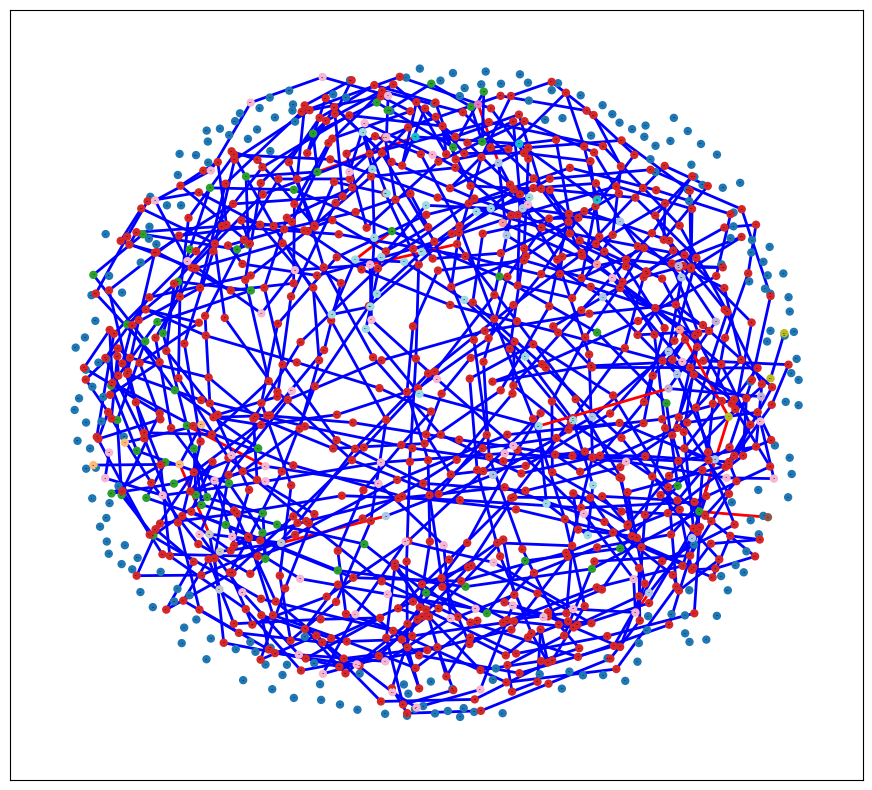

In [142]:
fig, ax = plt.subplots(1, 1, figsize=(11,10))
pos = nx.layout.spring_layout(G_tda, k=.13)
nx.draw_networkx(G_tda, pos=pos, with_labels=True,
                 nodelist=list(G_tda), edgelist=list(G_tda.edges()),
                 # node_size=[100 if G_tda.nodes[k]['branch'] == -1 else 300 if G_tda.nodes[k]['undecided'] else 444 for k in G_tda],
                 node_size=25,
                 node_color=[G_tda.nodes[k]['branch'] for k in G_tda],
                 cmap='tab20', 
                 # labels={k: G_tda.nodes[k]['name'] for k in G_tda},
                 font_size=1, # 10, 
                 width=2, 
                 edge_color=['b' if G_tda.edges[k]['connection'] == 'intra-branch' else 'r' for k in G_tda.edges()],
                 ax=ax)

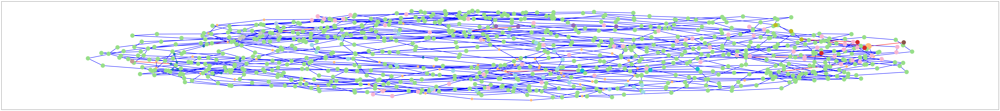

In [143]:
fig, ax = plt.subplots(1, 1, figsize=(91,10))
GG = G_tda.subgraph([k for k in G_tda if G_tda.nodes[k]['branch']>-1])
pos = nx.layout.spring_layout(GG, k=.09)
nx.draw_networkx(GG, pos=pos, with_labels=True,
                 nodelist=list(GG), edgelist=list(GG.edges()),
                 node_size=[1000 if k == tda_we.root else 50 if GG.nodes[k]['branch'] == -1 else 150 if GG.nodes[k]['undecided'] else 444 for k in GG],
                 node_color=[GG.nodes[k]['branch'] for k in GG],
                 cmap='tab20', 
                 # labels={k: GG.nodes[k]['name'] for k in GG},
                 font_size=1, # 10, 
                 width=2, 
                 edge_color=['b' if GG.edges[k]['connection'] == 'intra-branch' else 'r' for k in GG.edges()],
                 ax=ax)

## Second reconstruction:

In [150]:
G_tda2 = G_tda
print(G_tda2)

Graph with 1111 nodes and 905 edges


In [152]:
print(G_tda)

Graph with 1111 nodes and 905 edges


In [156]:
segs_a = tda_we.ordered_segs()

In [158]:
segs_a[0]


array([  15,   85,  550,  397,  738,  159,  976,  942,   24,  580, 1008,
        715,  954,  448])

array([862, 298, 297, ..., 726, 221, 240])

In [165]:
tda_we.changepoints

array([ 205,  219,  223,  282, 1010, 1013, 1017, 1018, 1019, 1077, 1081,
       1084, 1087])

In [155]:
G_tda = nx.Graph()

if tda_we.segs_names_unique[0] == -1:
    x0 = tda_we.changepoints[0]
    changepoints = tda_we.changepoints[1:]
else: 
    x0 = 0
    changepoints = tda_we.changepoints
    
segs = []
for x1 in changepoints:
    segs.append(tda_we.indices[x0:x1])
    x0 = x1
segs.append(tda_we.indices[x0:])

In [151]:
G_tda = nx.Graph()

if tda_we.segs_names_unique[0] == -1:
    x0 = tda_we.changepoints[0]
    changepoints = tda_we.changepoints[1:]
else: 
    x0 = 0
    changepoints = tda_we.changepoints
    
segs = []
for x1 in changepoints:
    segs.append(tda_we.indices[x0:x1])
    x0 = x1
segs.append(tda_we.indices[x0:])
# print(segs)
# # print(tda_we.segs_tips)

# add missing nodes
missing_nodes = set((range(tda_we.distances.shape[0]))) - set(itertools.chain(*segs))
print(f"{len(missing_nodes)} missing nodes")
G_tda.add_nodes_from(list(missing_nodes), branch=-1)
nx.set_node_attributes(G_tda, {k: False for k in missing_nodes}, name='undecided')
# nx.set_node_attributes(G_tda, {k: -1 for k in missing_nodes}, name='branch')
print(G_tda)


# add edges within branch:
# G_tda.add_edges_from(list(itertools.chain(*[[(k[i], k[i+1]) for i in range(k.size-1)] for k in segs])))
# print(G_tda)
for ix, seg in enumerate(segs):
    print(f"{ix}: {seg}")
    G_tda.add_edges_from(zip(seg, seg[1:]), connection='intra-branch')
    if len(seg) == 1:
        G_tda.add_node(seg[0])        
    nx.set_node_attributes(G_tda, {v: {'branch': ix, 'undecided': tda_we.segs_undecided[ix]} for v in seg})    
    
print(G_tda)
# print(G_tda.edges())
# print(G_tda.edges[(85,63)])
# print(G_tda.nodes[41], G_tda.nodes[82])

# print(sorted(G_tda))
# # add edges between branches
segs_connects_triu = sc_sparse.triu(tda_we.segs_connects).tocsr()
rows, cols = segs_connects_triu.nonzero()
inter_branch_edges = [(tda_we.segs_connects[r, c], tda_we.segs_connects[c, r]) for r, c in zip(rows, cols)]
G_tda.add_edges_from(inter_branch_edges, connection='inter-branch')
print(G_tda)
# print(sorted(G_tda))

nx.set_node_attributes(G_tda, dict(zip(range(keeper.num_observations), 
                                       keeper.observation_labels)), name='name')
# print(G_tda.nodes[0], G_tda.nodes[len(tda_we.index_labels)-1])    

205 missing nodes
Graph with 205 nodes and 0 edges
0: [  15   85  550  397  738  159  976  942   24  580 1008  715  954  448]
1: [ 443 1075 1062  480]
2: [ 132  377  943 1101  939  388  619  368 1036  400  307  475  359 1010
  253  193  275  940 1003  147 1098  900  110  262  106  918  216  349
  830  811 1086 1042   18  447  926  549  198  694  123  578  790  413
  277  205  673   72  777  681   10  346  289  753  606 1073  532 1067
  768 1069  254]
3: [1047 1072  912  814  354   39  423 1064 1089  363  237  676  308   89
  269  745  267  615  467  956  161  967   48  153  181  728  362  955
  843  687  374  620  433  434  564  855  505  765  574  306  693  512
 1082  650  533  881   58   78  817  133  839  471  490  636  654  348
  604  178 1025  963  907  303 1024  893  941 1021  401  813  478  152
  227  410 1011  665  896   35  314  701  444  260  191  188  951  986
  356 1110  163   80  210  503  584   87  261 1005  892  508  771  597
  866  140  561 1091  998  957  429 1096  407

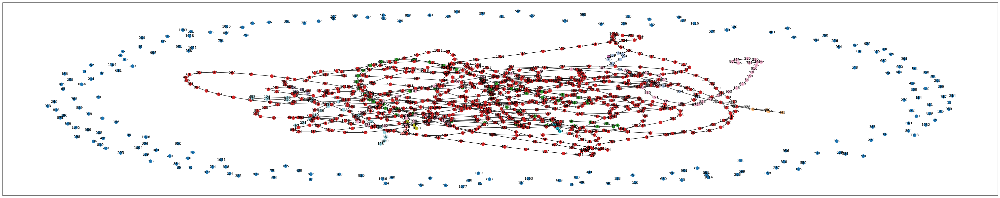

In [146]:
fig, ax = plt.subplots(1, 1, figsize=(51,10))
pos = None
nx.draw_networkx(G_tda, pos=pos, with_labels=True,
                 nodelist=list(G_tda), edgelist=list(G_tda.edges()),
                 node_size=80,# 644, 
                 node_color=[G_tda.nodes[k]['branch'] for k in G_tda],
                 cmap='tab20', 
                 # labels={k: G_tda.nodes[k]['name'] for k in G_tda},
                 font_size=10, # edge_color
                 ax=ax)

In [147]:
G_tda = nx.Graph()

# add edges within branch
G_tda.add_edges_from(list(itertools.chain(*[[(k[i], k[i+1]) for i in range(k.size-1)] for k in tda_we.segs])))
print(G_tda)
# aa = set(G_tda)
# add edges between branches
segs_connects_triu = sc_sparse.triu(tda_we.segs_connects).tocsr()
G_tda.add_edges_from([(tda_we.segs_connects[r, c], tda_we.segs_connects[c, r]) for r, c in zip(rows, cols)])
print(G_tda)
# print(set(G_tda) - aa)
# set(itertools.chain(*[(tda_we.segs_connects[r, c], tda_we.segs_connects[c, r]) for r, c in zip(rows, cols)])) - set(itertools.chain(*tda_we.segs))

missing_nodes = set((range(tda_we.distances.shape[0]))) - set(itertools.chain(*tda_we.segs))
print(f"{len(missing_nodes)} missing nodes")
G_tda.add_nodes_from(list(missing_nodes))
nx.set_node_attributes(G_tda, {k: False for k in missing_nodes}, name='undecided')
nx.set_node_attributes(G_tda, {k: -1 for k in missing_nodes}, name='branch')
      
      
nx.set_node_attributes(G_tda, dict(zip(range(keeper.num_observations), 
                                       keeper.observation_labels)), name='name')
for ix, seg in enumerate(tda_we.segs):
    nx.set_node_attributes(G_tda, {k: ix for k in seg}, name='branch')
# tda_we.segs_tips

for seg, l in zip(tda_we.segs, tda_we.segs_undecided):
    if l:
        nx.set_node_attributes(G_tda, {k: True for k in seg}, name='undecided')
    else:
        nx.set_node_attributes(G_tda, {k: False for k in seg}, name='undecided')




Graph with 2 nodes and 3 edges
Graph with 24 nodes and 15 edges
1109 missing nodes


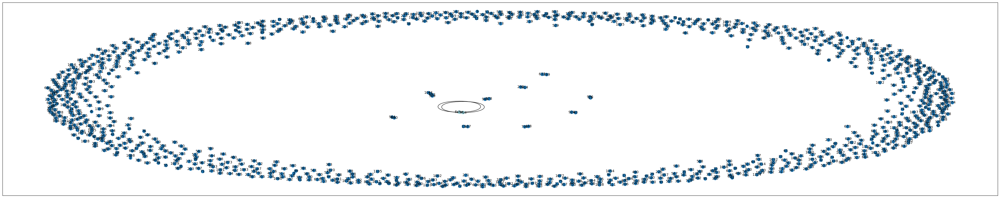

In [148]:
fig, ax = plt.subplots(1, 1, figsize=(51,10))
pos = None
nx.draw_networkx(G_tda, pos=pos, with_labels=True,
                 nodelist=list(G_tda), edgelist=list(G_tda.edges()),
                 node_size=80,# 644, 
                 node_color=[G_tda.nodes[k]['branch'] for k in G_tda],
                 cmap='tab20', 
                 # labels={k: G_tda.nodes[k]['name'] for k in G_tda},
                 font_size=10, # edge_color
                 ax=ax)